In [21]:
import sys
from pathlib import Path

p = Path.cwd()
while p != p.parent and not (p / "src").exists():
    p = p.parent

REPO = p
SRC = REPO / "src"
sys.path.insert(0, str(SRC))

print("Using REPO:", REPO)
print("SRC exists:", SRC.exists(), SRC)

%load_ext autoreload
%autoreload 2


Using REPO: /Users/oliwiaw/PycharmProjects/WMUM
SRC exists: True /Users/oliwiaw/PycharmProjects/WMUM/src
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [22]:
import eval_models

DATASETS = ["cats_dogs", "traffic_signs", "vehicles"]

# ile obrazków generować na model (zapis do runs/eval_vis/...)
N_IMAGES_SAVE = 12

# ile obrazków wyświetlać w notebooku (po 4)
N_SHOW = 4


In [23]:
from dataclasses import asdict

rows = []

# YOLO (czerwony)
for ds in DATASETS:
    for m in ["yolov8n", "yolov8s"]:
        r = eval_models.eval_yolo(ds, m, n_images=N_IMAGES_SAVE, conf=0.25, seed=0, color="red")
        rows.append(asdict(r))
        print(r)

# Torchvision: fasterrcnn (niebieski), retinanet (zielony)
for ds in DATASETS:
    r = eval_models.eval_torchvision(ds, "fasterrcnn", n_images=N_IMAGES_SAVE, score_thr=0.25, seed=0, device="cpu", color="blue")
    rows.append(asdict(r))
    print(r)

    r = eval_models.eval_torchvision(ds, "retinanet", n_images=N_IMAGES_SAVE, score_thr=0.25, seed=0, device="cpu", color="green")
    rows.append(asdict(r))
    print(r)

# zapis CSV z quick-eval
import pandas as pd
df = pd.DataFrame(rows)
out_csv = eval_models.OUT / "quick_eval_all.csv"
out_csv.parent.mkdir(parents=True, exist_ok=True)
df.to_csv(out_csv, index=False)
out_csv


EvalRow(framework='ultralytics', dataset='cats_dogs', model='yolov8n', n_images=12, score_thr=0.25, topk=3, avg_dets_per_img=1.1666666666666667, avg_score=0.7174987537520272, out_dir='/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/cats_dogs__yolov8n')
EvalRow(framework='ultralytics', dataset='cats_dogs', model='yolov8s', n_images=12, score_thr=0.25, topk=3, avg_dets_per_img=1.0, avg_score=0.7336976627508799, out_dir='/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/cats_dogs__yolov8s')
EvalRow(framework='ultralytics', dataset='traffic_signs', model='yolov8n', n_images=12, score_thr=0.25, topk=3, avg_dets_per_img=1.5, avg_score=0.5395099073648453, out_dir='/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/traffic_signs__yolov8n')
EvalRow(framework='ultralytics', dataset='traffic_signs', model='yolov8s', n_images=12, score_thr=0.25, topk=3, avg_dets_per_img=0.8333333333333334, avg_score=0.4817248463630676, out_dir='/Users/oliwiaw/PycharmProjects/WM

PosixPath('/Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/quick_eval_all.csv')

In [24]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

def show_4(folder: Path, title: str):
    imgs = sorted(folder.glob("*__pred.jpg"))[:4]
    print("Folder:", folder)
    print("Found:", len(imgs))

    plt.figure(figsize=(10, 8))
    plt.suptitle(title)
    for i, p in enumerate(imgs):
        ax = plt.subplot(2, 2, i + 1)
        ax.imshow(Image.open(p))
        ax.set_title(p.name, fontsize=8)
        ax.axis("off")
    plt.tight_layout()


Folder: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/cats_dogs__yolov8n
Found: 4
Folder: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/cats_dogs__yolov8s
Found: 4
Folder: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/cats_dogs__fasterrcnn
Found: 4
Folder: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/cats_dogs__retinanet
Found: 4
Folder: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/traffic_signs__yolov8n
Found: 4
Folder: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/traffic_signs__yolov8s
Found: 4
Folder: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/traffic_signs__fasterrcnn
Found: 4
Folder: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/torchvision/traffic_signs__retinanet
Found: 4
Folder: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/vehicles__yolov8n
Found: 4
Folder: /Users/oliwiaw/PycharmProjects/WMUM/runs/eval_vis/ultralytics/vehicles__yolov8s
Found

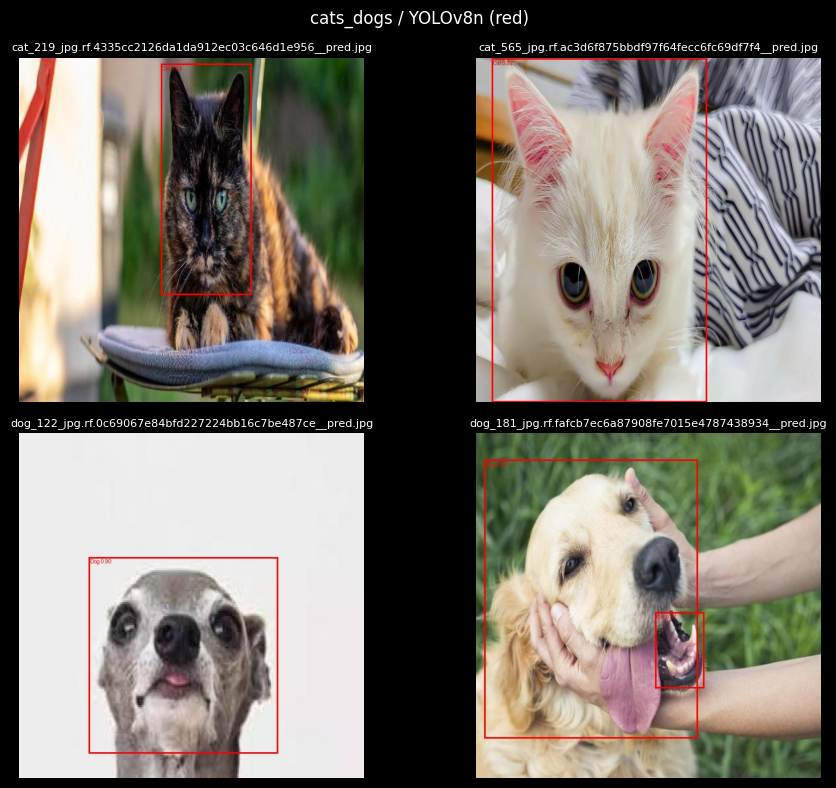

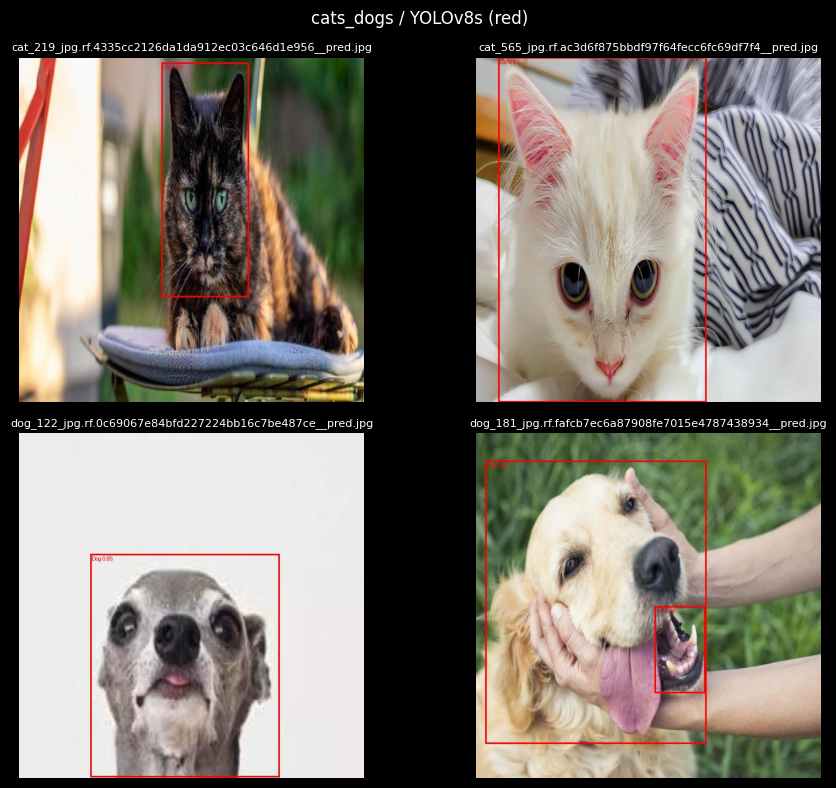

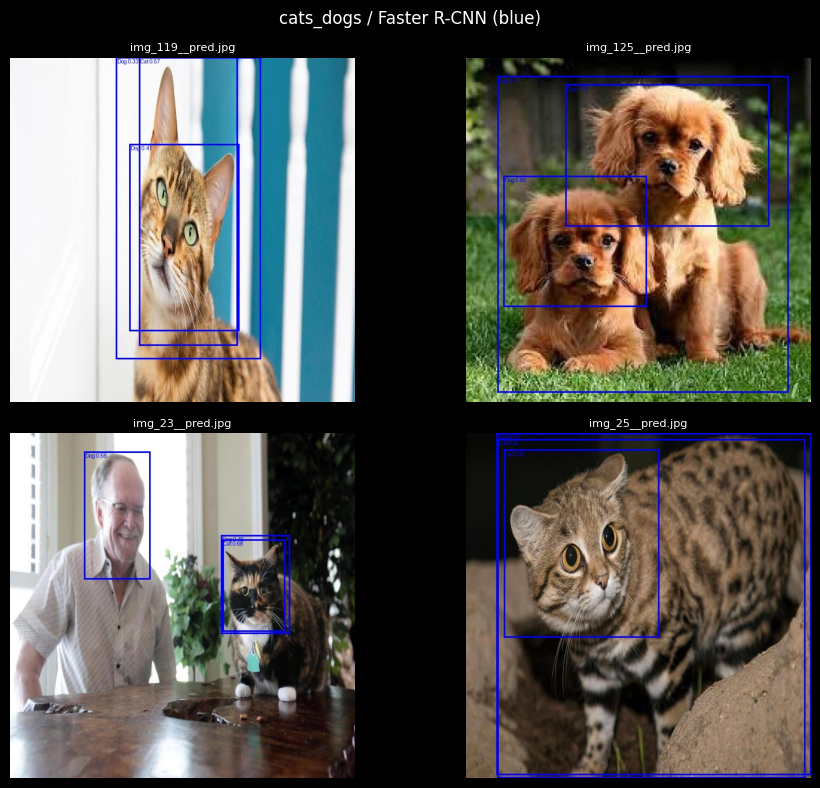

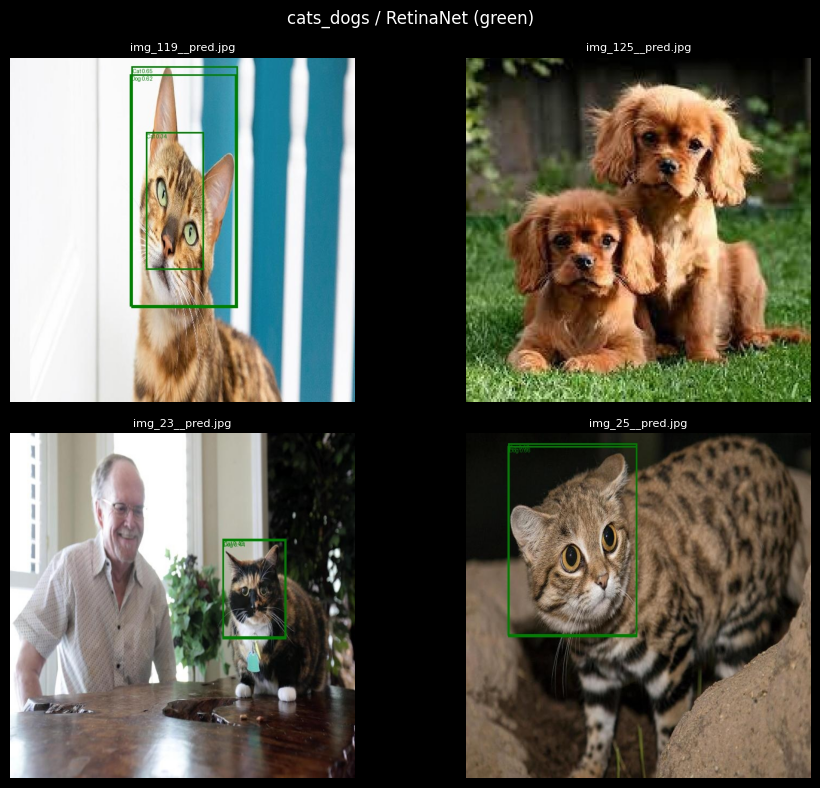

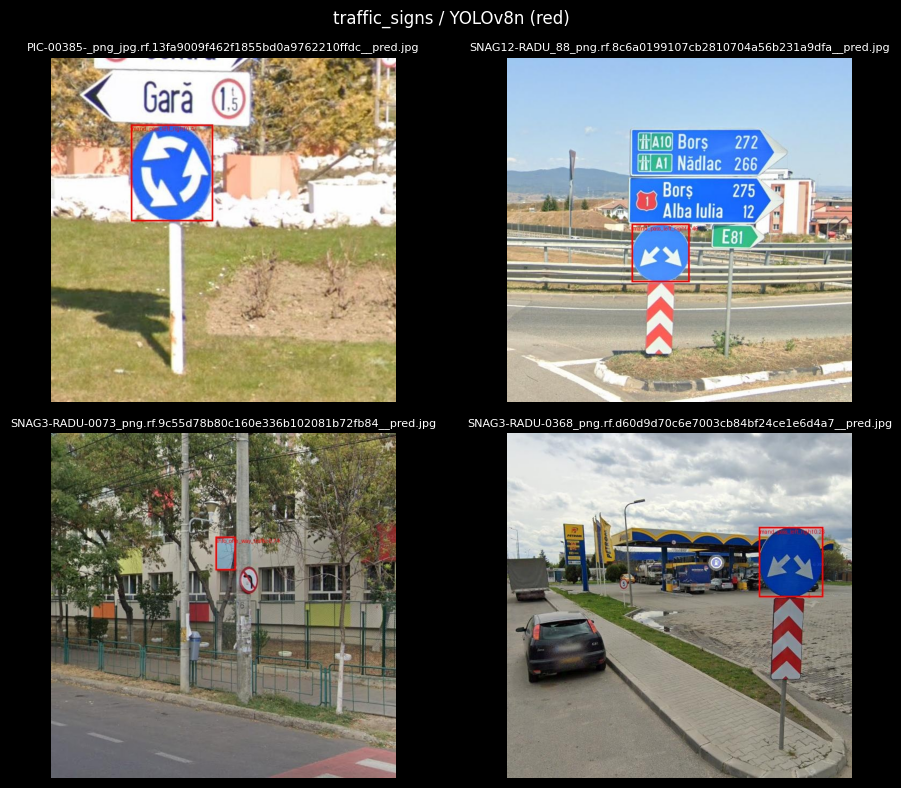

...

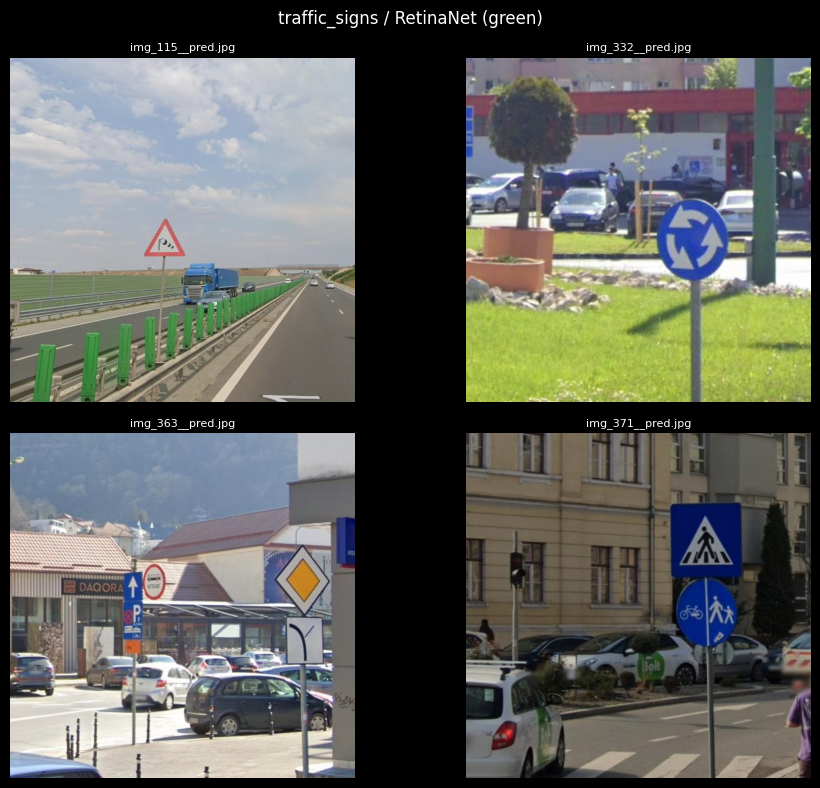

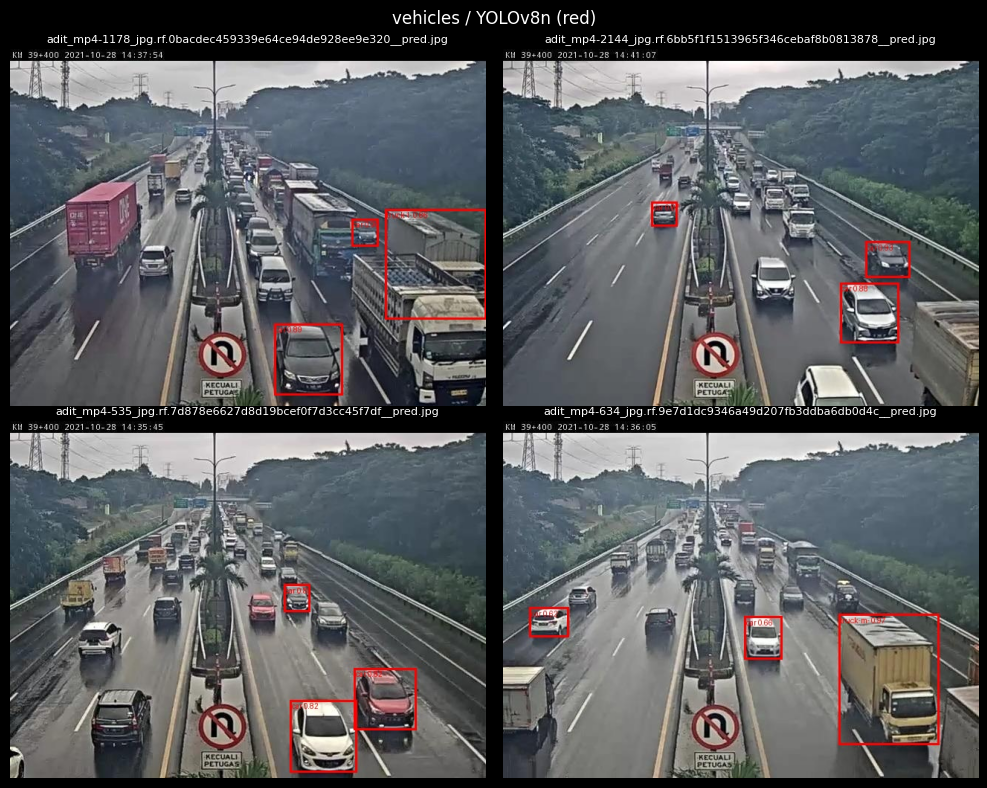

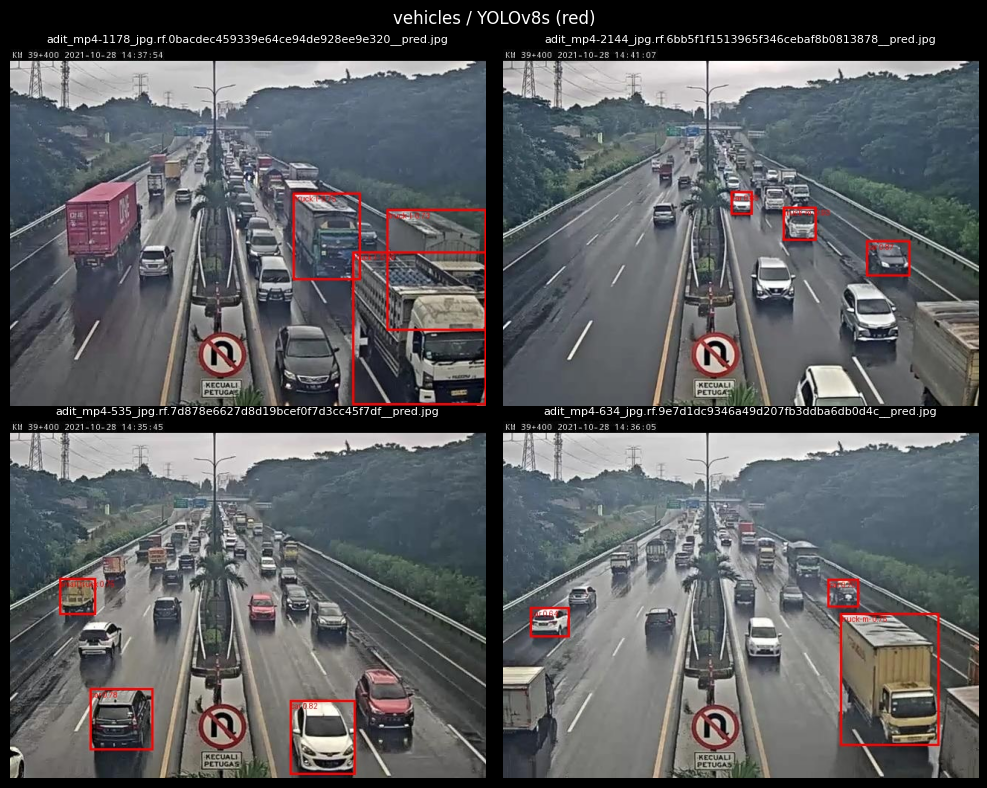

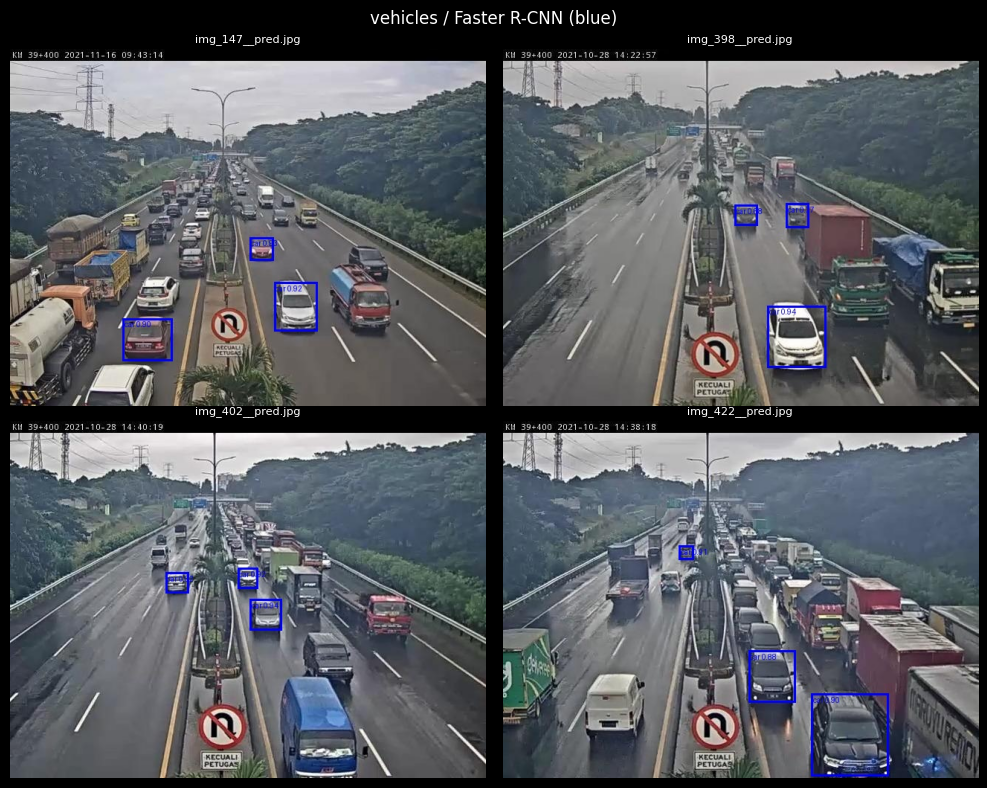

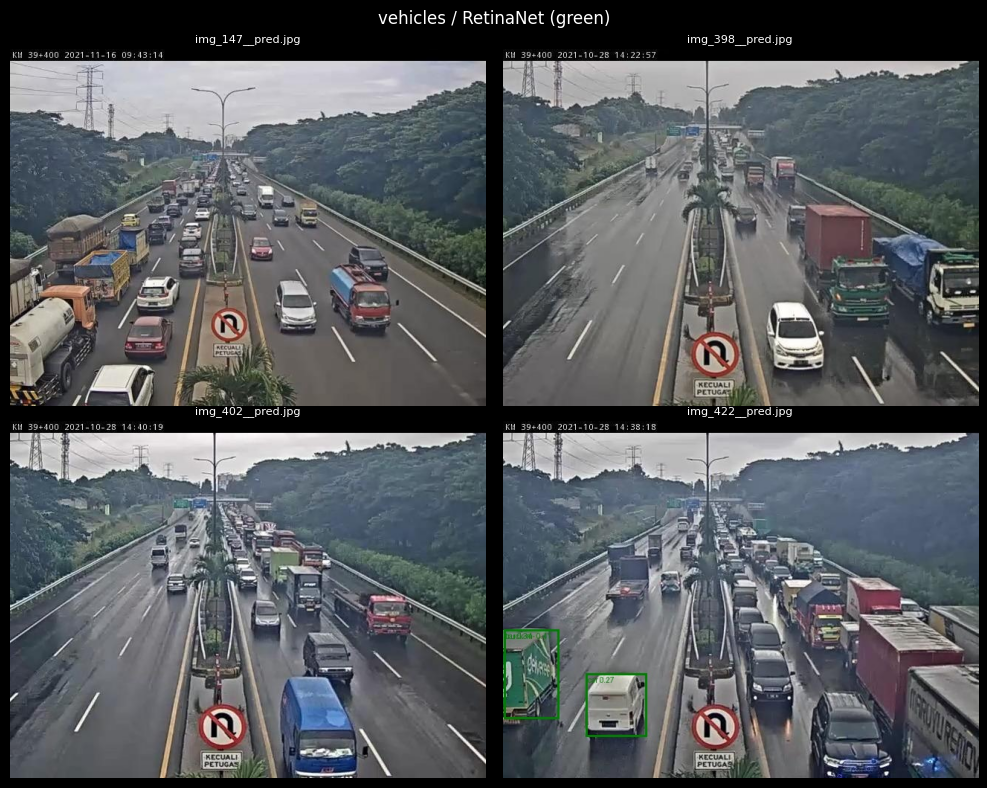

In [25]:
root = eval_models.OUT

for ds in DATASETS:
    show_4(root / "ultralytics" / f"{ds}__yolov8n",  f"{ds} / YOLOv8n (red)")
    show_4(root / "ultralytics" / f"{ds}__yolov8s",  f"{ds} / YOLOv8s (red)")

    show_4(root / "torchvision" / f"{ds}__fasterrcnn", f"{ds} / Faster R-CNN (blue)")
    show_4(root / "torchvision" / f"{ds}__retinanet",  f"{ds} / RetinaNet (green)")
